In [1]:
# Telling matplotlib to plot graphs inline
%matplotlib inline 

import warnings
warnings.filterwarnings('ignore')

import csv
import cPickle as pickle
import os
import numpy as np
from pandas.io.parsers import read_csv
from sklearn.utils import shuffle
import matplotlib.pyplot as plt

import sys
import theano
import time
from matplotlib import cm

import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GMM
from matplotlib.colors import LogNorm

from lasagne import layers
from lasagne.updates import nesterov_momentum
from nolearn.lasagne import NeuralNet

import cPickle as pickle

Using gpu device 0: GRID K520 (CNMeM is disabled, cuDNN 5005)


In [2]:
FTRAIN = '../data/training.csv'
FTEST = '../data/test.csv'
FLOOKUP ='../data/IdLookupTable.csv'


def load(test=False, cols=None):
    """Loads data from FTEST if *test* is True, otherwise from FTRAIN.
    Pass a list of *cols* if you're only interested in a subset of the
    target columns.
    """
    fname = FTEST if test else FTRAIN
    df = read_csv(os.path.expanduser(fname))  # load pandas dataframe

    # The Image column has pixel values separated by space; convert
    # the values to numpy arrays:
    df['Image'] = df['Image'].apply(lambda im: np.fromstring(im, sep=' '))

    if cols:  # get a subset of columns
        df = df[list(cols) + ['Image']]

    print(df.count())  # prints the number of values for each column
#     df = df.dropna()  # drop all rows that have missing values in them

    X = np.vstack(df['Image'].values) / 255.  # scale pixel values to [0, 1]
    X = X.astype(np.float32)

    if not test:  # only FTRAIN has any target columns
        y = df[df.columns[:-1]].values
        y = (y - 48) / 48  # scale target coordinates to [-1, 1]
#         X, y = shuffle(X, y, random_state=42)  # shuffle train data
        y = y.astype(np.float32)
    else:
        y = None

    return X, y


X, y = load()
print("X.shape == {}; X.min == {:.3f}; X.max == {:.3f}".format(
    X.shape, X.min(), X.max()))
print("y.shape == {}; y.min == {:.3f}; y.max == {:.3f}".format(
    y.shape, y.min(), y.max()))

left_eye_center_x            7039
left_eye_center_y            7039
right_eye_center_x           7036
right_eye_center_y           7036
left_eye_inner_corner_x      2271
left_eye_inner_corner_y      2271
left_eye_outer_corner_x      2267
left_eye_outer_corner_y      2267
right_eye_inner_corner_x     2268
right_eye_inner_corner_y     2268
right_eye_outer_corner_x     2268
right_eye_outer_corner_y     2268
left_eyebrow_inner_end_x     2270
left_eyebrow_inner_end_y     2270
left_eyebrow_outer_end_x     2225
left_eyebrow_outer_end_y     2225
right_eyebrow_inner_end_x    2270
right_eyebrow_inner_end_y    2270
right_eyebrow_outer_end_x    2236
right_eyebrow_outer_end_y    2236
nose_tip_x                   7049
nose_tip_y                   7049
mouth_left_corner_x          2269
mouth_left_corner_y          2269
mouth_right_corner_x         2270
mouth_right_corner_y         2270
mouth_center_top_lip_x       2275
mouth_center_top_lip_y       2275
mouth_center_bottom_lip_x    7016
mouth_center_b

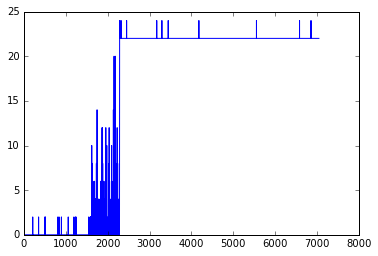

In [3]:
y_count_na = np.sum(np.isnan(y),1)
plt.plot(y_count_na)

In [8]:
idx_ds_2 = y_count_na.tolist().index(22)

img_ds_30 = X[:idx_ds_2]
img_ds_8 = X[idx_ds_2:]

train_ds_30 = y[:idx_ds_2]
train_ds_8 = y[idx_ds_2:]

print img_ds_30.shape, img_ds_8.shape
print train_ds_30.shape, train_ds_8.shape

(2284, 9216) (4765, 9216)
(2284, 30) (4765, 30)


In [9]:
keypoints = ['left_eye_center_x','left_eye_center_y','right_eye_center_x','right_eye_center_y','left_eye_inner_corner_x', \
             'left_eye_inner_corner_y','left_eye_outer_corner_x','left_eye_outer_corner_y','right_eye_inner_corner_x', \
             'right_eye_inner_corner_y','right_eye_outer_corner_x','right_eye_outer_corner_y','left_eyebrow_inner_end_x', \
             'left_eyebrow_inner_end_y','left_eyebrow_outer_end_x','left_eyebrow_outer_end_y','right_eyebrow_inner_end_x', \
             'right_eyebrow_inner_end_y','right_eyebrow_outer_end_x','right_eyebrow_outer_end_y','nose_tip_x','nose_tip_y', \
             'mouth_left_corner_x','mouth_left_corner_y','mouth_right_corner_x','mouth_right_corner_y', \
             'mouth_center_top_lip_x','mouth_center_top_lip_y','mouth_center_bottom_lip_x','mouth_center_bottom_lip_y']

keypoints_ds_8 = [0,1,2,3,20,21,28,29]


train_ds_8_sub = train_ds_8[:,keypoints_ds_8]
print train_ds_8_sub.shape

(4765, 8)


In [10]:
train_8_nona_idx = np.sum(np.isnan(train_ds_8_sub),1) == 0
train_30_nona_idx = np.sum(np.isnan(train_ds_30),1) == 0

img_8_nona = img_ds_8[train_8_nona_idx]
img_30_nona = img_ds_30[train_30_nona_idx]

train_8_nona = train_ds_8_sub[train_8_nona_idx]
train_30_nona = train_ds_30[train_30_nona_idx]

print img_8_nona.shape, img_30_nona.shape
print train_8_nona.shape, train_30_nona.shape

(4755, 9216) (2140, 9216)
(4755, 8) (2140, 30)


In [42]:
from random import randint
np.random.seed(0)

def plot_sample(x, y, axis):
    img = x.reshape(96, 96)
    axis.imshow(img, cmap='gray')
    if not y == None:
        y = y * 48 + 48
        axis.scatter(y[0::2], y[1::2], marker='x', s=25)

def plot_images(images, labels, test = False):
    fig = plt.figure(figsize=(16, 56))
    fig.subplots_adjust(
        left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

    for i in range(56):
        idx = randint(0, len(images))
        ax = fig.add_subplot(16, 4, i+1, xticks=[], yticks=[])
        if test == True:
            plot_sample(images[idx], None, ax)
        else:
            plot_sample(images[idx], labels[idx], ax)

    plt.show()

## Plotting 8 keypoints train dataset

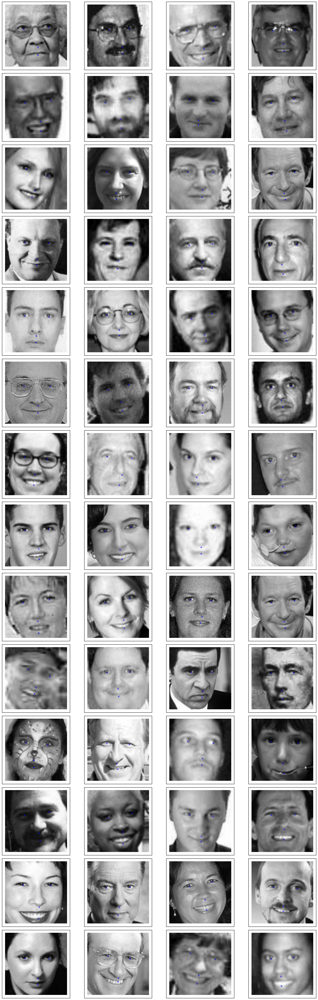

In [37]:
plot_images(img_8_nona, train_8_nona)

## Plotting 30 keypoints train dataset

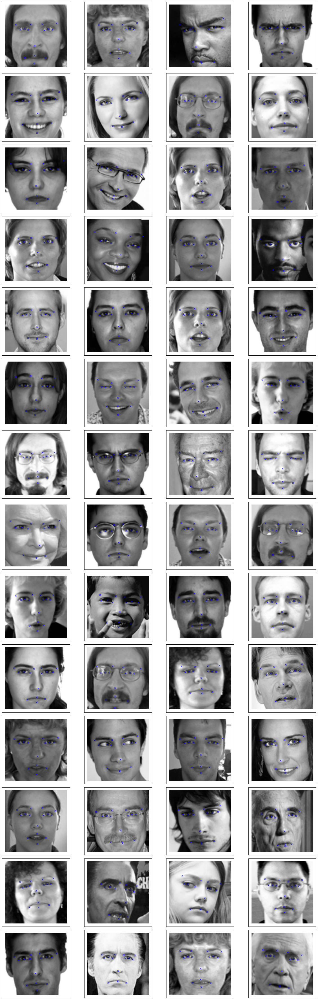

In [38]:
plot_images(img_30_nona, train_30_nona)

## Plotting test dataset

591


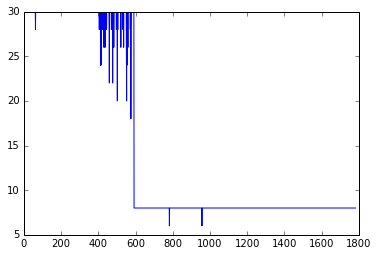

In [39]:
FLOOKUP = '../data/IdLookupTable.csv'
submissionImages = read_csv(os.path.expanduser(FLOOKUP))
subKeypoints = submissionImages.groupby(['ImageId']).size()
idx_sub_ds_8 = subKeypoints.tolist().index(8)
print idx_sub_ds_8
plt.plot(subKeypoints)

In [40]:
# Prep test data
test_img, foo = load(test=True) 
test_img_30 = test_img[:idx_sub_ds_8]
test_img_8 = test_img[idx_sub_ds_8:]

print test_img_30.shape, test_img_8.shape

ImageId    1783
Image      1783
dtype: int64
(591, 9216) (1192, 9216)


## Plotting 8 keypoints Test dataset

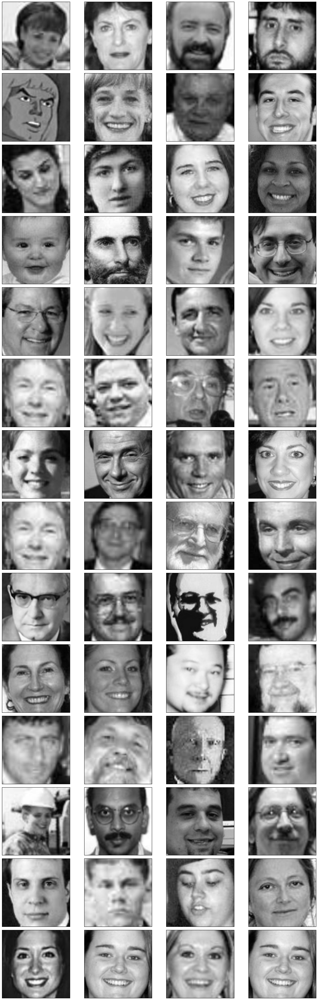

In [43]:
plot_images(test_img_8, None, True)

## Plotting 30 keypoints train dataset

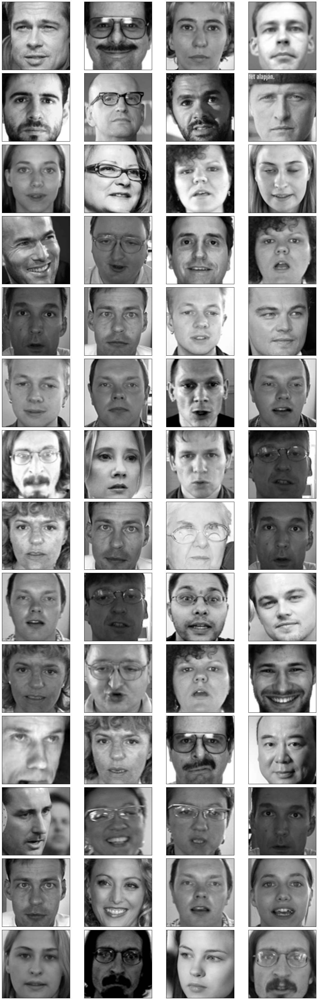

In [44]:
plot_images(test_img_30, None, True)